**PART 1 - MOBILE-NET MODEL**

**STEP 1**

In [ ]:
#Step 1
import tensorflow as tf
import matplotlib.pyplot as plt
import numpy as np
import os
from tensorflow.keras import layers, models
from tensorflow.keras.preprocessing import image

# === USER VARIABLES ===

# Path to your dataset folder organized by class subfolders
#DATASET_DIR = 'dataset/'
DATASET_DIR = '/content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work/Assets/insects_dataset/train_data'
# Image input size and batch size for training
IMG_SIZE = (224, 224)
BATCH_SIZE = 32
SEED = 123  # For deterministic shuffling/splitting

# === STEP 1: Load dataset and split into train/validation ===

print("Loading dataset with 80/20 train-validation split...")
train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print(f"Classes found: {class_names}")

Loading dataset with 80/20 train-validation split...
Found 310 files belonging to 3 classes.
Using 248 files for training.
Found 310 files belonging to 3 classes.
Using 62 files for validation.
Classes found: ['Ephemerellidae', 'Nemoura sp', 'Sericostomatidae sp']


**STEP 2**

In [ ]:
# === STEP 2: Optimize dataset performance ===

AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

**STEP 3**

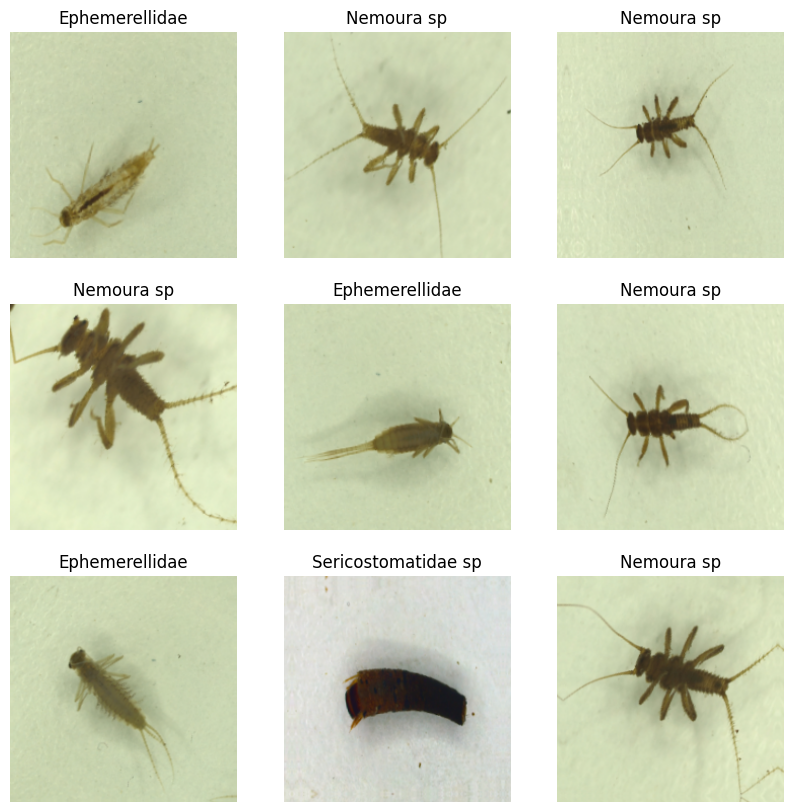

In [ ]:
# === STEP 3: Data augmentation (recommended) ===

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# Visualize some augmented images
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    augmented_images = data_augmentation(images)
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(augmented_images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()

**STEP 4**

In [ ]:
# === STEP 4: Build transfer learning model ===

base_model = tf.keras.applications.MobileNetV2(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)

base_model.trainable = False  # Freeze the base model initially

inputs = layers.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)
x = tf.keras.applications.mobilenet_v2.preprocess_input(x)
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)

model = models.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_11 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_3 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ true_divide_2 (TrueDivide)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ subtract_2 (Subtract)           │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ mobilenetv2_1.00_224            │ (None, 7, 7, 1280)     │     2,257,984 │
│ (Functional)                    │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_3      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 3)              │         3,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,261,827 (8.63 MB)

 Trainable params: 3,843 (15.01 KB)

 Non-trainable params: 2,257,984 (8.61 MB)

**STEP 5**

In [ ]:
# === STEP 5: Train the model ===

EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - accuracy: 0.6452 - loss: 0.8177 - val_accuracy: 0.8226 - val_loss: 0.4897
Epoch 2/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.8589 - loss: 0.3752 - val_accuracy: 0.9839 - val_loss: 0.2496
Epoch 3/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 23s 2s/step - accuracy: 0.9597 - loss: 0.2165 - val_accuracy: 0.9677 - val_loss: 0.1669
Epoch 4/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 41s 3s/step - accuracy: 0.9758 - loss: 0.1397 - val_accuracy: 0.9839 - val_loss: 0.1314
Epoch 5/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 21s 3s/step - accuracy: 0.9677 - loss: 0.1222 - val_accuracy: 0.9677 - val_loss: 0.1059
Epoch 6/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9839 - loss: 0.0944 - val_accuracy: 0.9677 - val_loss: 0.0908
Epoch 7/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 19s 2s/step - accuracy: 0.9798 - loss: 0.0827 - val_accuracy: 0.9677 - val_loss: 0.0822
Epoch 8/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 22s 2s/step - accuracy: 0.9879 - loss: 0.0696 - val_accuracy: 0.9839 - val_loss: 0.0801
Epoch 9/

**STEP 6**

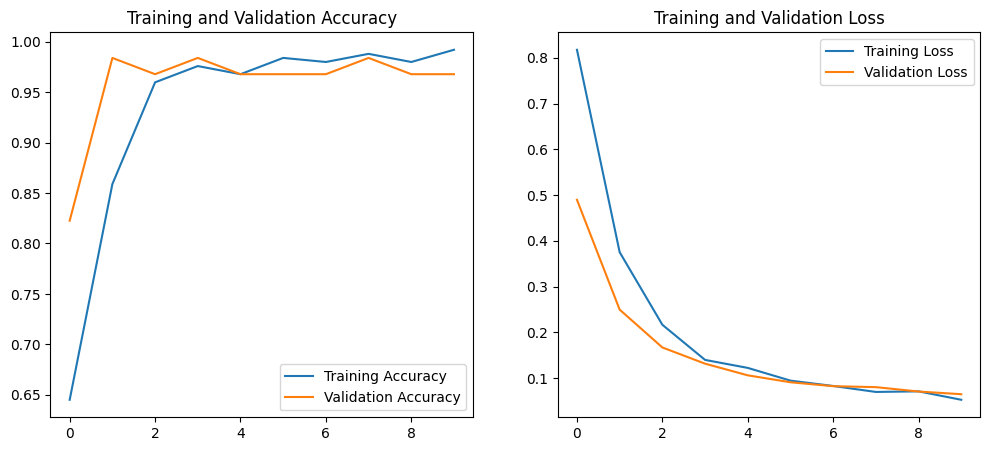

In [ ]:
# === STEP 6: Plot training curves ===

# Re-extracting from history to ensure correct length for initial EPOCHS
initial_acc = history.history['accuracy']
initial_val_acc = history.history['val_accuracy']
initial_loss = history.history['loss']
initial_val_loss = history.history['val_loss']

epochs_range = range(EPOCHS)

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(epochs_range, initial_acc, label='Training Accuracy')
plt.plot(epochs_range, initial_val_acc, label='Validation Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.subplot(1, 2, 2)
plt.plot(epochs_range, initial_loss, label='Training Loss')
plt.plot(epochs_range, initial_val_loss, label='Validation Loss')
plt.legend()
plt.title('Training and Validation Loss')
plt.show()

**STEP 7**

In [ ]:
# === STEP 7: Evaluate on validation set ===

val_loss, val_acc = model.evaluate(val_ds)
print(f'Validation accuracy: {val_acc*100:.2f}%')

2/2 ━━━━━━━━━━━━━━━━━━━━ 5s 2s/step - accuracy: 0.9677 - loss: 0.0647
Validation accuracy: 96.77%


**STEP 8**

In [ ]:
# === STEP 8: Save the trained model ===
%cd /content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work
model.save('macroinvertebrates_classifier.h5')
print("Model saved as 'macroinvertebrates_classifier.h5'")

/content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work
Model saved as 'macroinvertebrates_classifier.h5'


**STEP 9**

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


<Figure size 1200x1200 with 0 Axes>

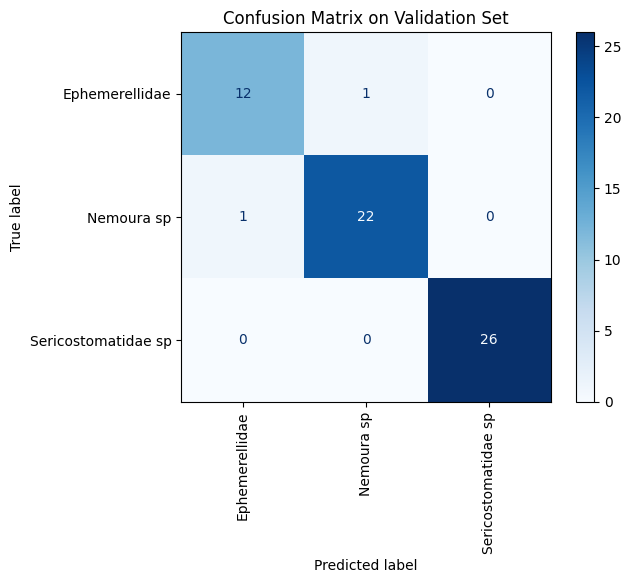

Weighted Precision: 0.9677
Weighted Recall:    0.9677
Weighted F1-score:  0.9677


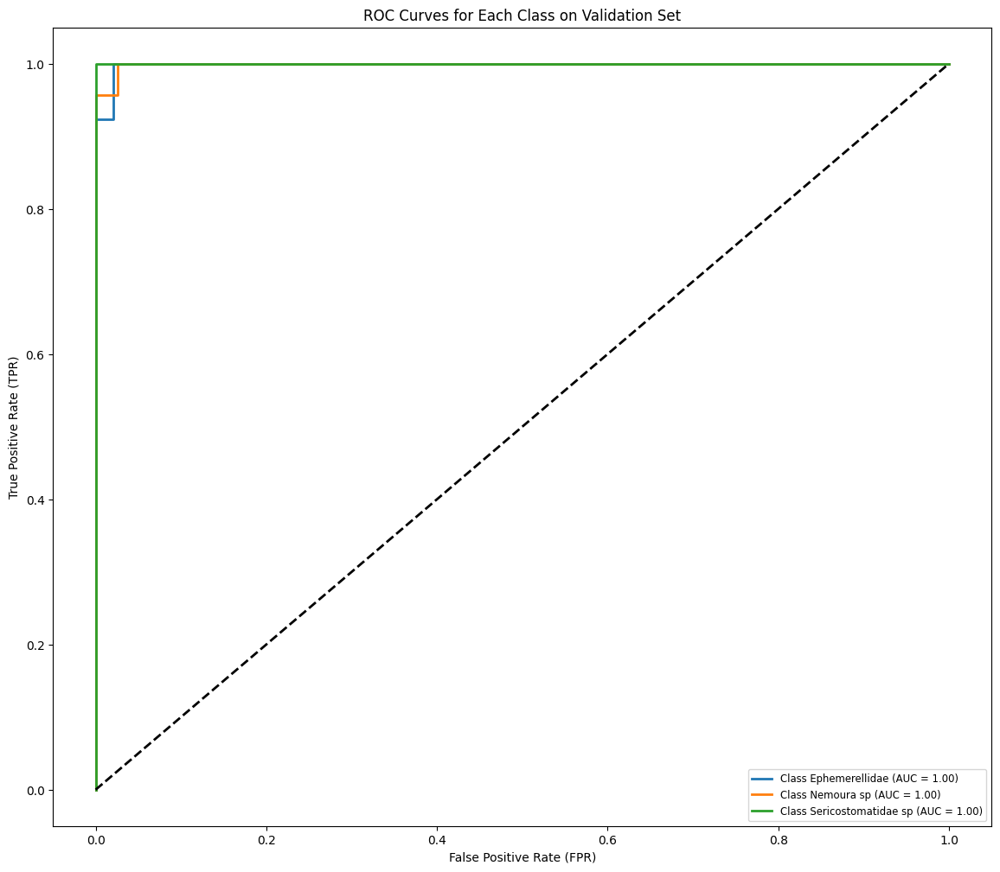

In [ ]:
# === STEP 9: Evaluate model with confusion matrix, precision, recall, F1-score ===

import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf
import os

# Step 9.1: Aggregate predictions and true labels from validation dataset
y_true = []
y_pred = []
y_scores = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_scores.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_scores = np.array(y_scores)

# Step 9.2: Confusion Matrix Plot
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)

plt.figure(figsize=(12,12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix on Validation Set')
plt.show()

# Step 9.3: Precision, Recall, F1-score (weighted average)
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'
)
print(f"Weighted Precision: {precision:.4f}")
print(f"Weighted Recall:    {recall:.4f}")
print(f"Weighted F1-score:  {f1:.4f}")

# Step 9.4: Multi-class ROC curves and AUC

# Binarize the labels for multi-class ROC
y_true_bin = label_binarize(y_true, classes=range(len(class_names)))
n_classes = y_true_bin.shape[1]

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_scores[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2,
             label=f'Class {class_names[i]} (AUC = {roc_auc[i]:0.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel("False Positive Rate (FPR)")
plt.ylabel("True Positive Rate (TPR)")
plt.title("ROC Curves for Each Class on Validation Set")
plt.legend(loc="lower right", fontsize='small')
plt.show()

**STEP 10**

Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
Original Image: CPH-Sericostomatidae sp.-2287-t.png --> Predicted: Sericostomatidae sp (93.93%)


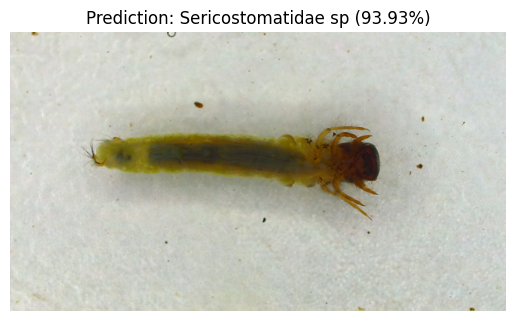

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
Original Image: CPH-Sericostomatidae sp.-2282-t.png --> Predicted: Sericostomatidae sp (93.80%)


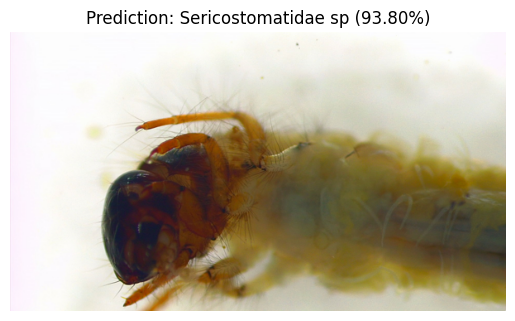

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
Original Image: CPH-Sericostomatidae sp.-2229-t.png --> Predicted: Sericostomatidae sp (93.75%)


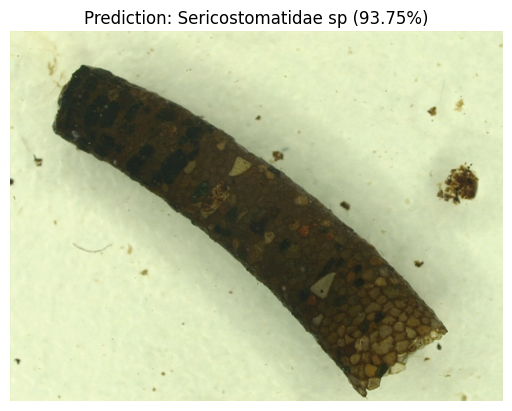

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 151ms/step
Original Image: CPH-Sericostomatidae sp.-2231-t.png --> Predicted: Sericostomatidae sp (94.06%)


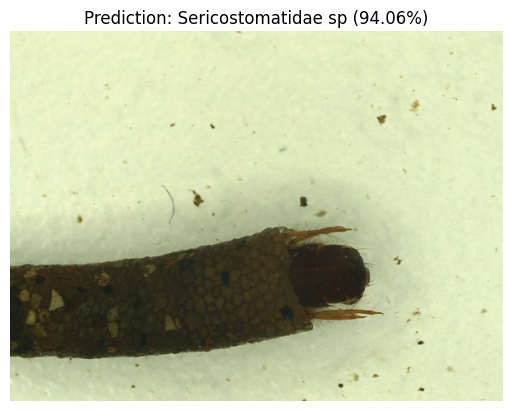

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
Original Image: CPH-Sericostomatidae sp.-2269-t.png --> Predicted: Sericostomatidae sp (93.99%)


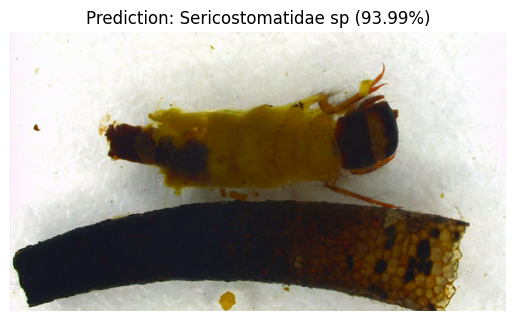

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
Original Image: CPH-Ephemerellidae-571-t.png --> Predicted: Sericostomatidae sp (94.05%)


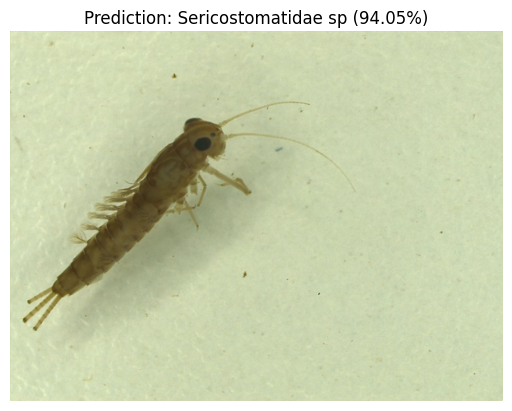

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 165ms/step
Original Image: CPH-Ephemerellidae-589-t.png --> Predicted: Sericostomatidae sp (94.05%)


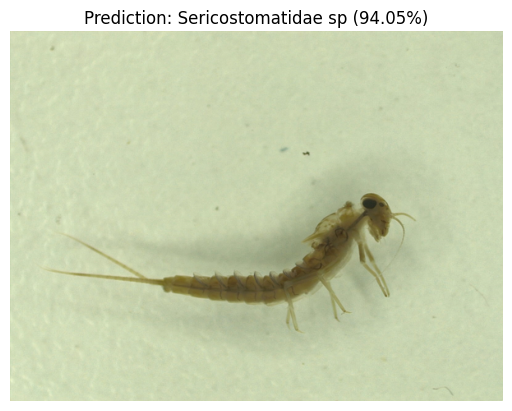

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Original Image: CPH-Ephemerellidae-607-t.png --> Predicted: Sericostomatidae sp (93.95%)


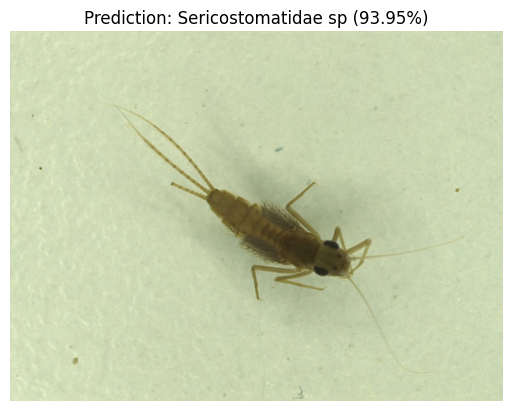

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
Original Image: CPH-Ephemerellidae-578-t.png --> Predicted: Sericostomatidae sp (94.01%)


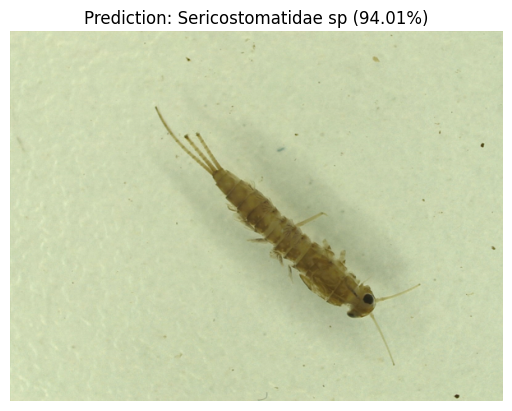

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
Original Image: CPH-Ephemerellidae-599-t.png --> Predicted: Sericostomatidae sp (94.13%)


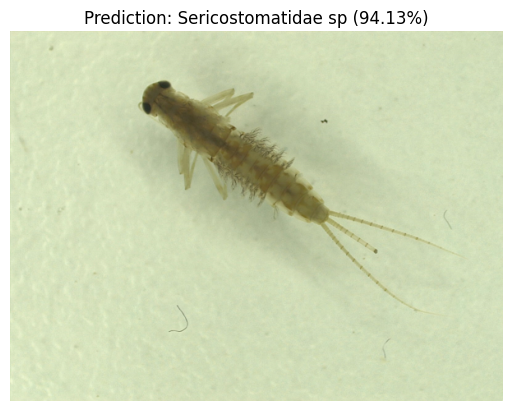

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
Original Image: CPH-Nemoura sp.-2032-t.png --> Predicted: Sericostomatidae sp (94.02%)


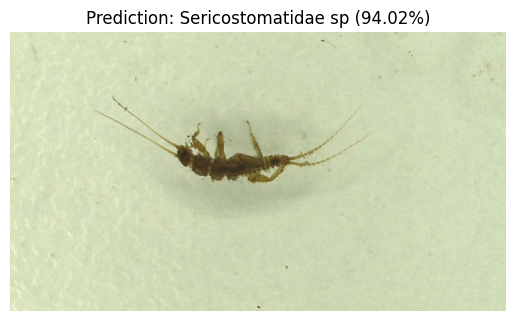

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
Original Image: CPH-Nemoura sp.-2015-t.png --> Predicted: Sericostomatidae sp (93.87%)


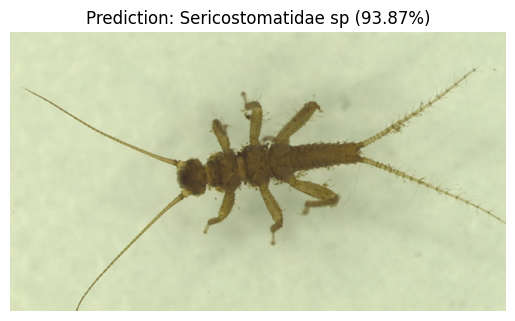

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
Original Image: CPH-Nemoura sp.-1989-t.png --> Predicted: Sericostomatidae sp (93.97%)


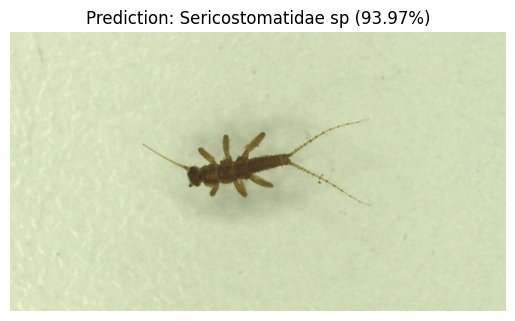

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
Original Image: CPH-Nemoura sp.-2025-t.png --> Predicted: Sericostomatidae sp (93.95%)


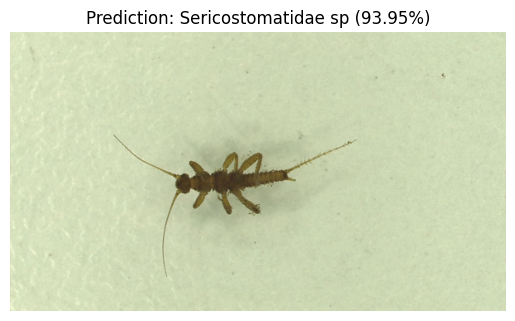

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
Original Image: CPH-Nemoura sp.-2006-t.png --> Predicted: Sericostomatidae sp (94.07%)


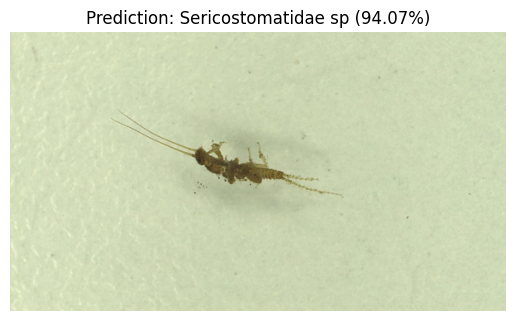

In [ ]:
# === STEP 10: Inference on new images in 'test_images' folder ===

#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = '/content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work/Assets/insects_dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

def load_and_preprocess_image(img_path, img_size=IMG_SIZE):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)

**PART 2 - EFFICIENTNET MODEL**

In [ ]:
import tensorflow as tf
from tensorflow.keras import layers, models
import matplotlib.pyplot as plt
import numpy as np
import os

DATASET_DIR = '/content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work/Assets/insects_dataset/train_data'

IMG_SIZE = (224, 224)        # EfficientNetB0 default input size
BATCH_SIZE = 32
SEED = 123

**STEP 1**

In [ ]:
# === STEP 1: Load dataset with 80/20 train-validation split ===

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="training",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset="validation",
    seed=SEED,
    image_size=IMG_SIZE,
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print("Classes:", class_names)

Found 310 files belonging to 3 classes.
Using 248 files for training.
Found 310 files belonging to 3 classes.
Using 62 files for validation.
Classes: ['Ephemerellidae', 'Nemoura sp', 'Sericostomatidae sp']


**STEP 2**

In [ ]:
# === STEP 2: Optimize dataset performance ===

AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

**STEP 3**

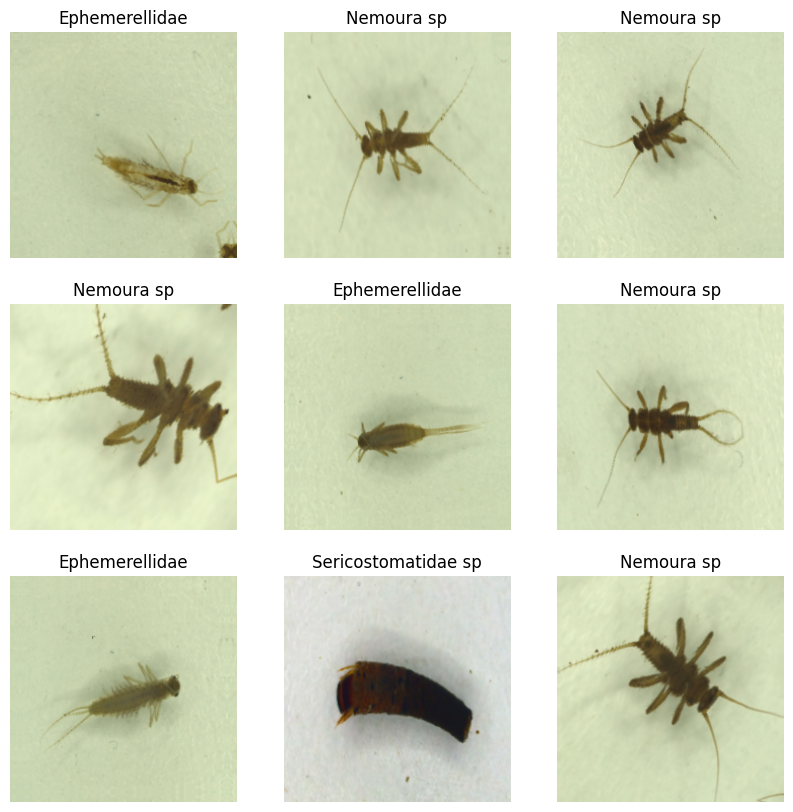

In [ ]:
# === STEP 3: Data augmentation ===

data_augmentation = tf.keras.Sequential([
    layers.RandomFlip("horizontal"),
    layers.RandomRotation(0.1),
    layers.RandomZoom(0.1),
])

# Optional: visualize augmented images
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    augmented = data_augmentation(images)
    for i in range(9):
        ax = plt.subplot(3, 3, i+1)
        plt.imshow(augmented[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()

**STEP 4**

In [ ]:
# === STEP 4: Build transfer learning model with EfficientNetB0 ===

base_model = tf.keras.applications.EfficientNetB0(
    input_shape=IMG_SIZE + (3,),
    include_top=False,
    weights='imagenet'
)
base_model.trainable = False  # freeze base

inputs = layers.Input(shape=IMG_SIZE + (3,))
x = data_augmentation(inputs)               # apply augmentation
x = tf.keras.applications.efficientnet.preprocess_input(x)  # preprocess as EfficientNet expects
x = base_model(x, training=False)
x = layers.GlobalAveragePooling2D()(x)
x = layers.Dropout(0.3)(x)
outputs = layers.Dense(num_classes, activation='softmax')(x)
model = models.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

model.summary()

Model: "functional_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_14 (InputLayer)     │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ sequential_4 (Sequential)       │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ efficientnetb0 (Functional)     │ (None, 7, 7, 1280)     │     4,049,571 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_4      │ (None, 1280)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 1280)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 3)              │         3,843 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,053,414 (15.46 MB)

 Trainable params: 3,843 (15.01 KB)

 Non-trainable params: 4,049,571 (15.45 MB)

**STEP 5**

In [ ]:
# === STEP 5: Train the model ===

EPOCHS = 10

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS
)

Epoch 1/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 45s 4s/step - accuracy: 0.5161 - loss: 0.9736 - val_accuracy: 0.7903 - val_loss: 0.5970
Epoch 2/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 29s 3s/step - accuracy: 0.8427 - loss: 0.4834 - val_accuracy: 0.8548 - val_loss: 0.3532
Epoch 3/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - accuracy: 0.9153 - loss: 0.3099 - val_accuracy: 0.9516 - val_loss: 0.2333
Epoch 4/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 30s 4s/step - accuracy: 0.9758 - loss: 0.1933 - val_accuracy: 0.9677 - val_loss: 0.1752
Epoch 5/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 31s 4s/step - accuracy: 0.9879 - loss: 0.1549 - val_accuracy: 0.9677 - val_loss: 0.1432
Epoch 6/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 39s 4s/step - accuracy: 0.9960 - loss: 0.1204 - val_accuracy: 0.9677 - val_loss: 0.1266
Epoch 7/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 28s 3s/step - accuracy: 0.9798 - loss: 0.1138 - val_accuracy: 0.9677 - val_loss: 0.1116
Epoch 8/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 30s 3s/step - accuracy: 0.9879 - loss: 0.0950 - val_accuracy: 0.9677 - val_loss: 0.1053
Epoch 9/

**STEP 6**

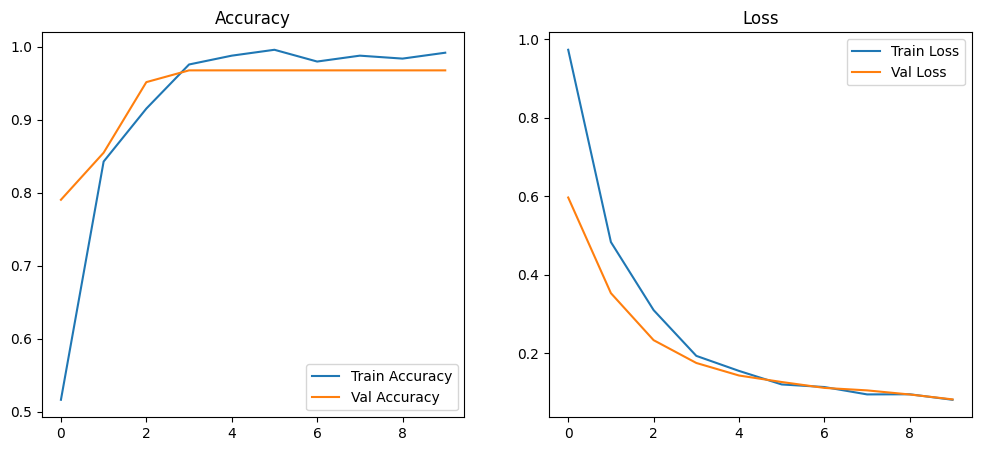

In [ ]:
# === STEP 6: Plot training curves ===

acc, val_acc = history.history['accuracy'], history.history['val_accuracy']
loss, val_loss = history.history['loss'], history.history['val_loss']

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy')
plt.plot(val_acc, label='Val Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.title('Loss')

plt.show()

**STEP 7**

Epoch 10/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 86s 6s/step - accuracy: 0.8508 - loss: 0.5177 - val_accuracy: 0.9839 - val_loss: 0.0821
Epoch 11/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 46s 5s/step - accuracy: 0.8347 - loss: 0.4852 - val_accuracy: 0.9839 - val_loss: 0.0820
Epoch 12/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 83s 6s/step - accuracy: 0.8911 - loss: 0.4217 - val_accuracy: 0.9839 - val_loss: 0.0821
Epoch 13/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 82s 6s/step - accuracy: 0.8871 - loss: 0.3831 - val_accuracy: 0.9839 - val_loss: 0.0829
Epoch 14/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 50s 6s/step - accuracy: 0.9234 - loss: 0.3470 - val_accuracy: 0.9839 - val_loss: 0.0829
Epoch 15/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 51s 6s/step - accuracy: 0.9032 - loss: 0.3425 - val_accuracy: 0.9839 - val_loss: 0.0829
Epoch 16/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 47s 6s/step - accuracy: 0.9677 - loss: 0.2683 - val_accuracy: 0.9839 - val_loss: 0.0826
Epoch 17/20
8/8 ━━━━━━━━━━━━━━━━━━━━ 45s 5s/step - accuracy: 0.9234 - loss: 0.2778 - val_accuracy: 0.9677 - val_loss: 0.0816


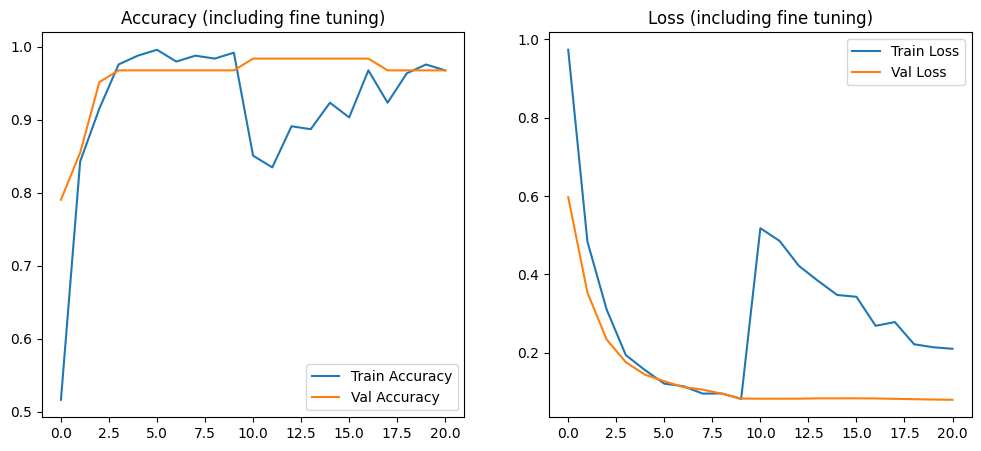

In [ ]:
# === STEP 7 (Optional): Fine-tune base model ===

base_model.trainable = True

# Freeze initial layers, train last layers of EfficientNet
fine_tune_at = 100  # Freeze all layers before this
for layer in base_model.layers[:fine_tune_at]:
    layer.trainable = False

model.compile(
    optimizer=tf.keras.optimizers.Adam(1e-5),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

fine_tune_epochs = 10
total_epochs = EPOCHS + fine_tune_epochs

history_fine = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=total_epochs,
    initial_epoch=history.epoch[-1]
)

# Plot fine-tuning results (optional)
acc += history_fine.history['accuracy']
val_acc += history_fine.history['val_accuracy']
loss += history_fine.history['loss']
val_loss += history_fine.history['val_loss']

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(acc, label='Train Accuracy')
plt.plot(val_acc, label='Val Accuracy')
plt.legend()
plt.title('Accuracy (including fine tuning)')

plt.subplot(1, 2, 2)
plt.plot(loss, label='Train Loss')
plt.plot(val_loss, label='Val Loss')
plt.legend()
plt.title('Loss (including fine tuning)')

plt.show()

**STEP 8**

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


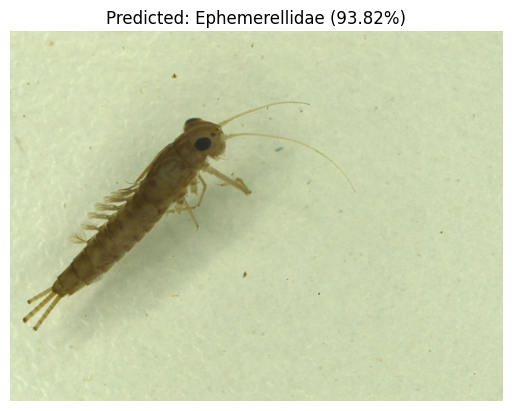

In [ ]:
# === STEP 8: Prediction on new images ===

from tensorflow.keras.preprocessing import image
import numpy as np
import matplotlib.pyplot as plt

def load_and_preprocess_image(img_path):
    img = image.load_img(img_path, target_size=IMG_SIZE)
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = tf.keras.applications.efficientnet.preprocess_input(img_array)
    return img_array

def predict_image(img_path, model, class_names):
    img_array = load_and_preprocess_image(img_path)
    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx]
    return class_names[pred_idx], confidence

# Example usage:
test_img_path = '/content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work/Assets/insects_dataset/test_data/CPH-Ephemerellidae-571-t.png'
predicted_class, confidence = predict_image(test_img_path, model, class_names)

plt.imshow(image.load_img(test_img_path))
plt.title(f'Predicted: {predicted_class} ({confidence * 100:.2f}%)')
plt.axis('off')
plt.show()

**STEP 9**

1/1 ━━━━━━━━━━━━━━━━━━━━ 6s 6s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


<Figure size 1200x1200 with 0 Axes>

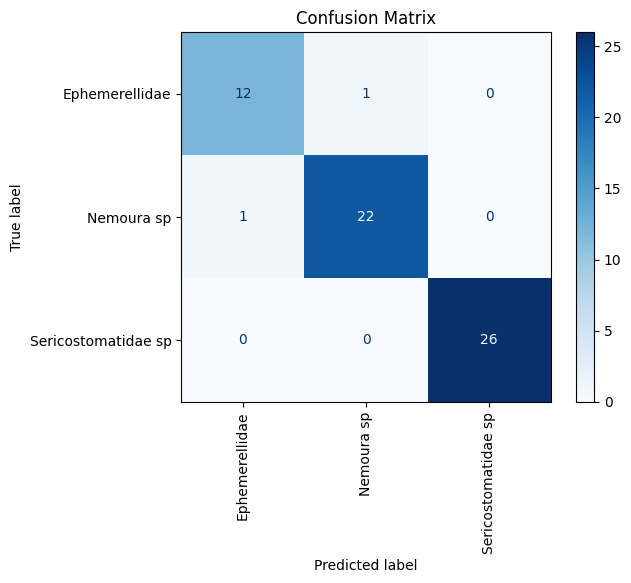

Precision: 0.9677
Recall:    0.9677
F1-score:  0.9677


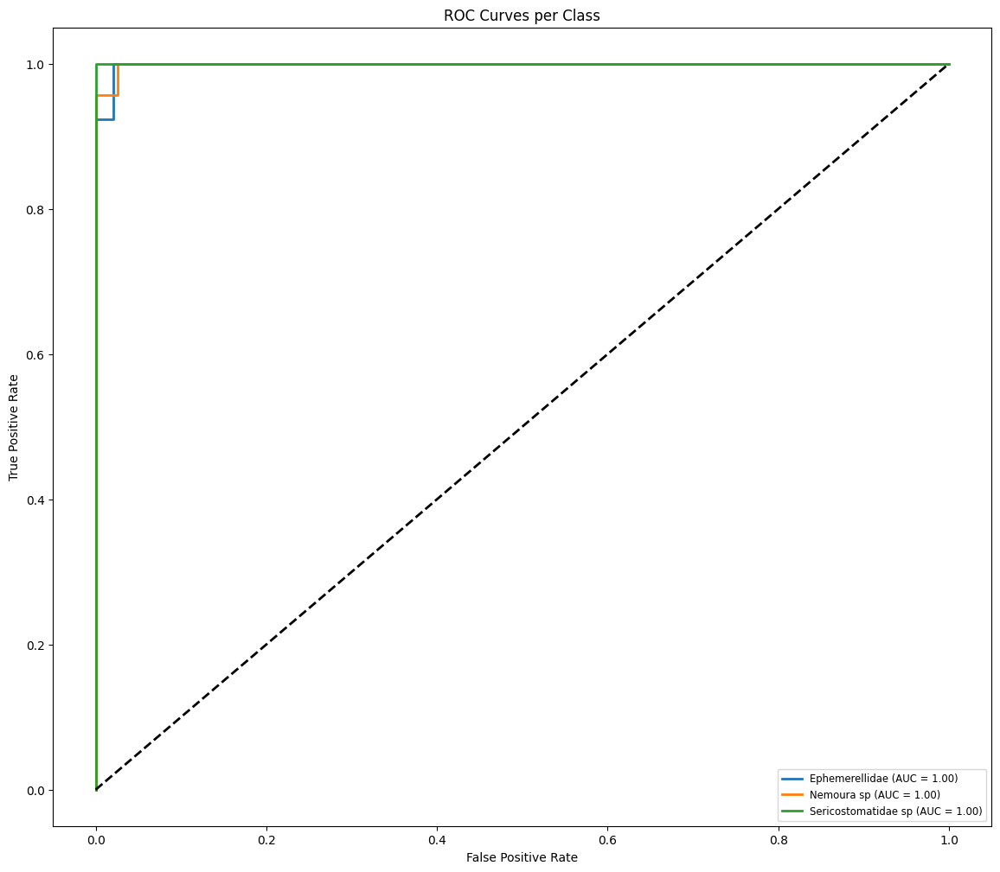

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf

# Aggregate true labels and predictions from validation dataset
y_true = []
y_pred = []
y_score = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_score.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(12, 12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix')
plt.show()

# Precision, Recall and F1-score
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'  # options: 'micro', 'macro', None...
)
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

# ROC Curve and AUC for multi-class
n_classes = len(class_names)
y_true_bin = label_binarize(y_true, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves per Class')
plt.legend(loc='lower right', fontsize='small')
plt.show()

**STEP 10**

Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
Original Image: CPH-Sericostomatidae sp.-2287-t.png --> Predicted: Nemoura sp (38.29%)


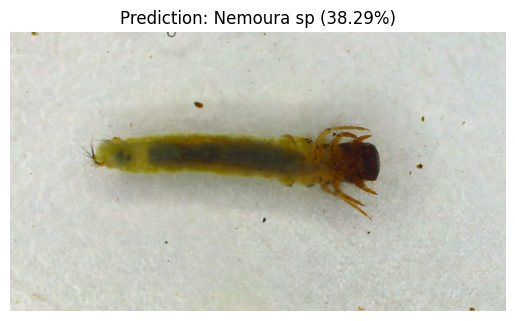

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step
Original Image: CPH-Sericostomatidae sp.-2282-t.png --> Predicted: Nemoura sp (38.42%)


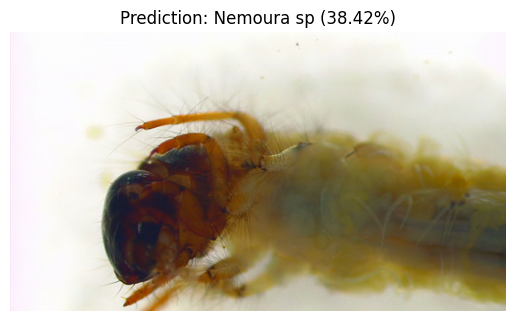

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 170ms/step
Original Image: CPH-Sericostomatidae sp.-2229-t.png --> Predicted: Nemoura sp (38.33%)


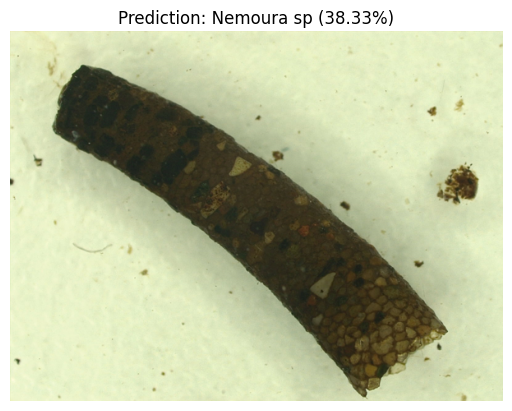

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step
Original Image: CPH-Sericostomatidae sp.-2231-t.png --> Predicted: Nemoura sp (38.29%)


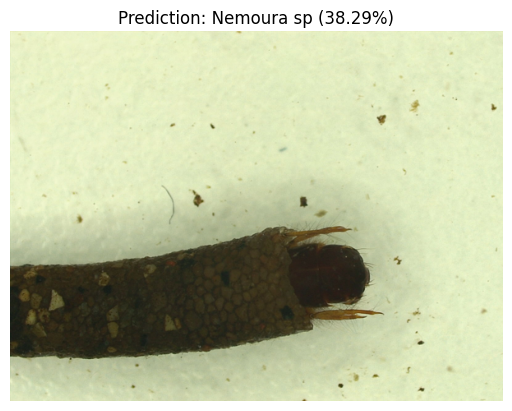

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 189ms/step
Original Image: CPH-Sericostomatidae sp.-2269-t.png --> Predicted: Nemoura sp (38.34%)


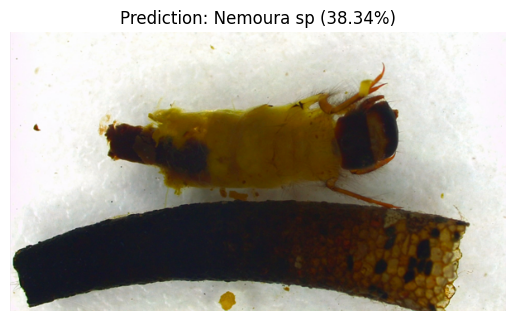

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 197ms/step
Original Image: CPH-Ephemerellidae-571-t.png --> Predicted: Nemoura sp (38.26%)


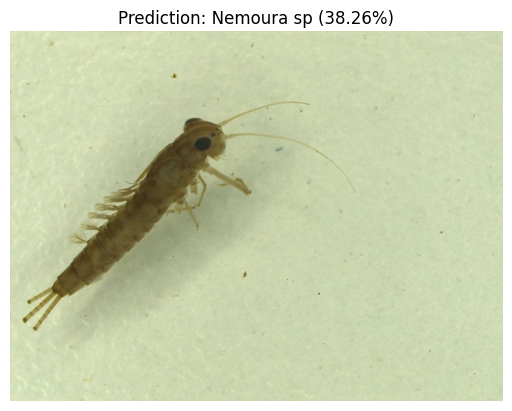

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 178ms/step
Original Image: CPH-Ephemerellidae-589-t.png --> Predicted: Nemoura sp (38.27%)


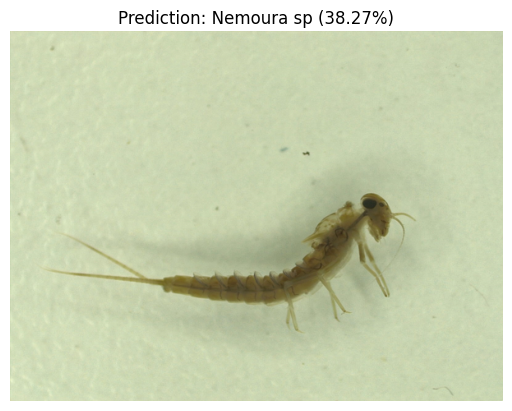

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 200ms/step
Original Image: CPH-Ephemerellidae-607-t.png --> Predicted: Nemoura sp (38.26%)


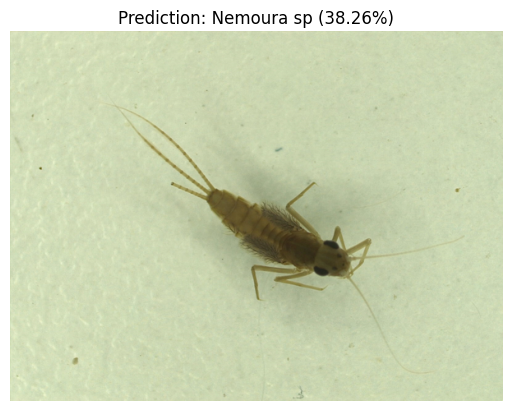

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 219ms/step
Original Image: CPH-Ephemerellidae-578-t.png --> Predicted: Nemoura sp (38.25%)


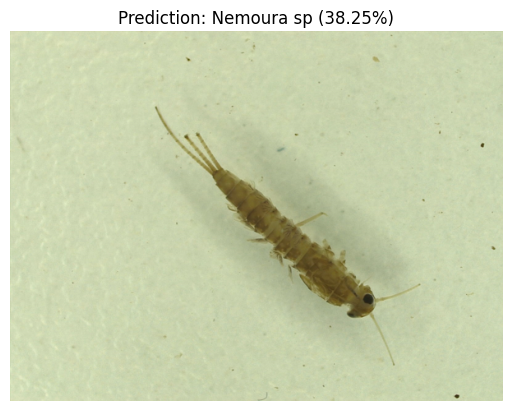

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
Original Image: CPH-Ephemerellidae-599-t.png --> Predicted: Nemoura sp (38.26%)


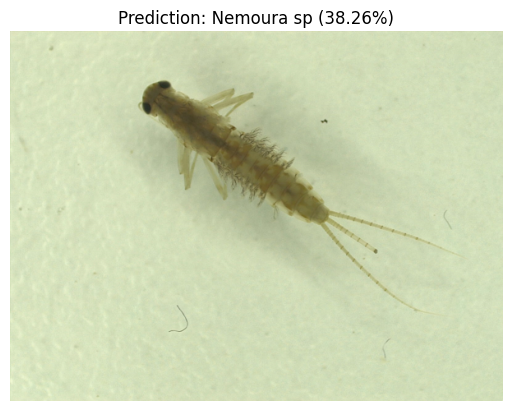

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
Original Image: CPH-Nemoura sp.-2032-t.png --> Predicted: Nemoura sp (38.25%)


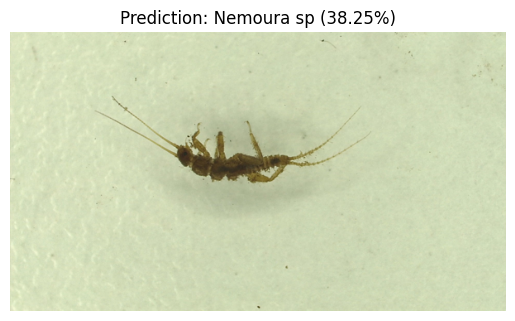

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 128ms/step
Original Image: CPH-Nemoura sp.-2015-t.png --> Predicted: Nemoura sp (38.28%)


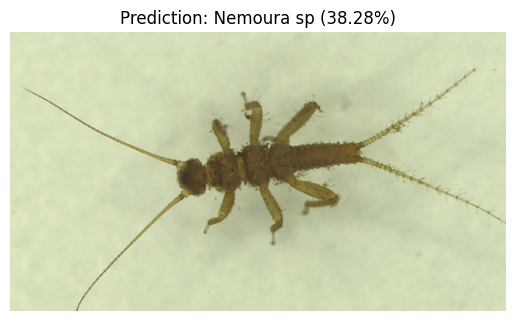

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 146ms/step
Original Image: CPH-Nemoura sp.-1989-t.png --> Predicted: Nemoura sp (38.25%)


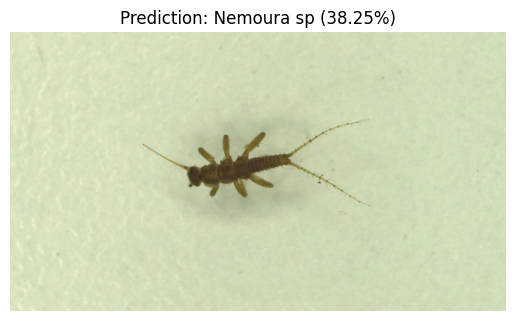

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
Original Image: CPH-Nemoura sp.-2025-t.png --> Predicted: Nemoura sp (38.25%)


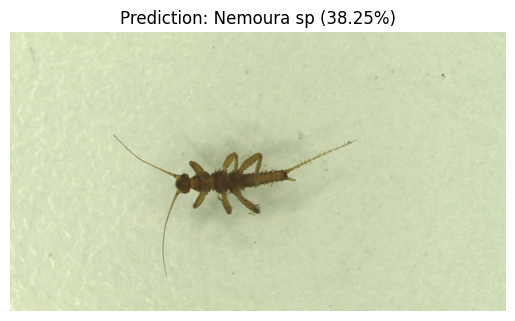

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 147ms/step
Original Image: CPH-Nemoura sp.-2006-t.png --> Predicted: Nemoura sp (38.25%)


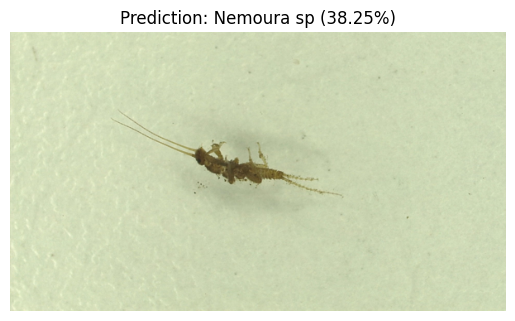

In [ ]:
# === STEP 10: Inference on new images in 'test_images' folder ===

#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = '/content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work/Assets/insects_dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

def load_and_preprocess_image(img_path, img_size=IMG_SIZE):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)

**PART 3 - VISION TRANSFORMER MODEL**

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_datasets as tfds
import matplotlib.pyplot as plt
import numpy as np
import os

# === User parameters ===
DATASET_DIR = '/content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work/Assets/insects_dataset/train_data'
IMG_SIZE = 224            # ViT input size
BATCH_SIZE = 32
SEED = 123
EPOCHS = 10

**STEP 1**

In [ ]:
# === Step 1: Load Dataset with 80/20 split ===

train_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset='training',
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

val_ds = tf.keras.preprocessing.image_dataset_from_directory(
    DATASET_DIR,
    validation_split=0.2,
    subset='validation',
    seed=SEED,
    image_size=(IMG_SIZE, IMG_SIZE),
    batch_size=BATCH_SIZE
)

class_names = train_ds.class_names
num_classes = len(class_names)
print(f"Classes: {class_names}")

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.prefetch(buffer_size=AUTOTUNE)

Found 310 files belonging to 3 classes.
Using 248 files for training.
Found 310 files belonging to 3 classes.
Using 62 files for validation.
Classes: ['Ephemerellidae', 'Nemoura sp', 'Sericostomatidae sp']


**STEP 2**

In [ ]:
# === Step 2: Data augmentation ===

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal"),
    tf.keras.layers.RandomRotation(0.1),
    tf.keras.layers.RandomZoom(0.1),
])

**STEP 3**

In [ ]:
# === Step 3: Load ViT Feature Extractor from TF Hub ===

vit_url = "https://tfhub.dev/sayakpaul/vit_b16_fe/1"
vit_layer = hub.KerasLayer(vit_url, trainable=False)

**STEP 4**

In [ ]:
# ==== Step 4:
inputs = tf.keras.Input(shape=(IMG_SIZE, IMG_SIZE, 3))

# Data augmentation
x = data_augmentation(inputs)

# The TF Hub ViT module expects pixel values in [0, 255].
# image_dataset_from_directory typically outputs float32 in [0, 255],
# and data_augmentation maintains this. So, no explicit [0,1] scaling is needed here.

# ViT feature extractor
# Wrap the vit_layer call in a Lambda layer to ensure proper symbolic tensor handling
features = tf.keras.layers.Lambda(lambda y: vit_layer(y))(x);

# Classification head
outputs = tf.keras.layers.Dense(num_classes, activation='softmax')(features)

model = tf.keras.Model(inputs, outputs)

model.compile(
    optimizer='adam',
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

**STEP 5**

In [ ]:
# === Step 5: Train the model ===

history = model.fit(
    train_ds,
    validation_data=val_ds,
    epochs=EPOCHS,
)

Epoch 1/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 314s 38s/step - accuracy: 0.5121 - loss: 1.6236 - val_accuracy: 0.6290 - val_loss: 1.4789
Epoch 2/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 245s 31s/step - accuracy: 0.7177 - loss: 1.1815 - val_accuracy: 0.6935 - val_loss: 0.7993
Epoch 3/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 293s 36s/step - accuracy: 0.6048 - loss: 0.7564 - val_accuracy: 0.6452 - val_loss: 0.6910
Epoch 4/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 243s 31s/step - accuracy: 0.7500 - loss: 0.6082 - val_accuracy: 0.7097 - val_loss: 0.6069
Epoch 5/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 295s 36s/step - accuracy: 0.7460 - loss: 0.5252 - val_accuracy: 0.7258 - val_loss: 0.5289
Epoch 6/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 279s 36s/step - accuracy: 0.7782 - loss: 0.4571 - val_accuracy: 0.7903 - val_loss: 0.4886
Epoch 7/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 244s 31s/step - accuracy: 0.8387 - loss: 0.4166 - val_accuracy: 0.7742 - val_loss: 0.4700
Epoch 8/10
8/8 ━━━━━━━━━━━━━━━━━━━━ 277s 36s/step - accuracy: 0.7984 - loss: 0.4091 - val_accuracy: 0.8226 - val_loss:

**STEP 6**

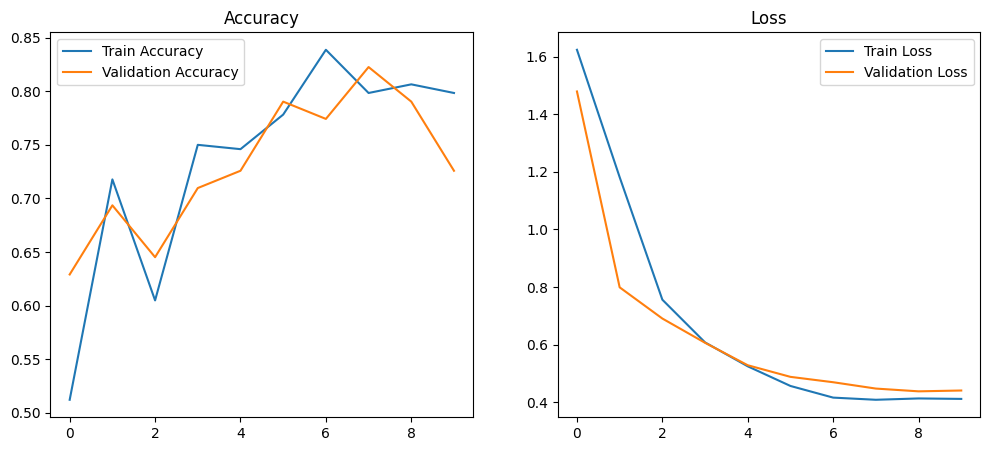

In [ ]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.legend()
plt.title('Accuracy')

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.legend()
plt.title('Loss')

plt.show()

**STEP 7**

In [ ]:
# === Step 7: Prediction helper function ===

def load_and_preprocess_image(img_path):
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=(IMG_SIZE, IMG_SIZE))
    img_array = tf.keras.preprocessing.image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0) / 255.0
    return img_array

def predict_image(img_path, model, class_names):
    img_array = load_and_preprocess_image(img_path)
    preds = model.predict(img_array)
    pred_idx = np.argmax(preds[0])
    confidence = preds[0][pred_idx]
    return class_names[pred_idx], confidence

**STEP 8**

1/1 ━━━━━━━━━━━━━━━━━━━━ 15s 15s/step


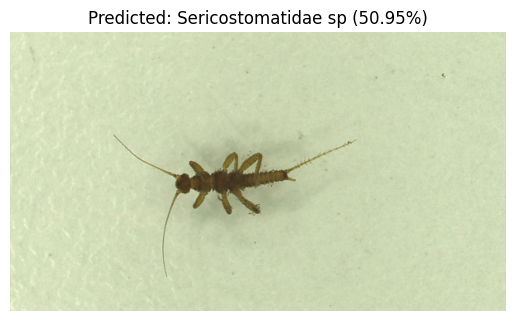

In [ ]:
# === Example prediction ===
test_img_path = '/content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work/Assets/insects_dataset/test_data/CPH-Nemoura sp.-2025-t.png'

predicted_class, confidence = predict_image(test_img_path, model, class_names)

plt.imshow(tf.keras.preprocessing.image.load_img(test_img_path))
plt.title(f'Predicted: {predicted_class} ({confidence*100:.2f}%)')
plt.axis('off')
plt.show()

**STEP 9**

1/1 ━━━━━━━━━━━━━━━━━━━━ 33s 33s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 24s 24s/step


<Figure size 1200x1200 with 0 Axes>

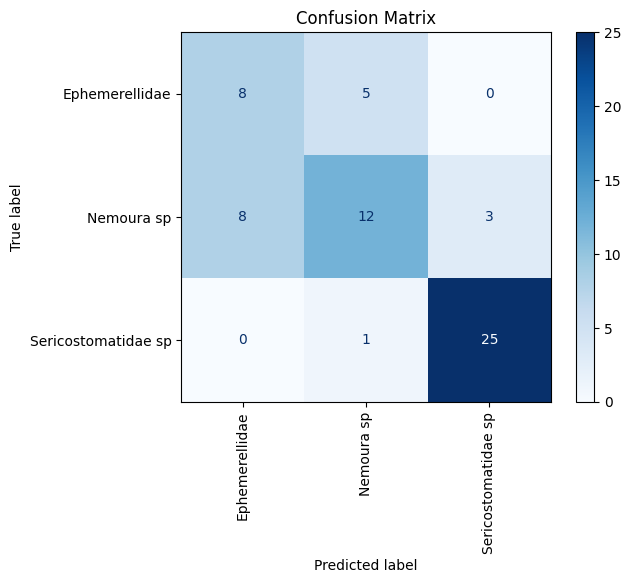

Precision: 0.7266
Recall:    0.7258
F1-score:  0.7211


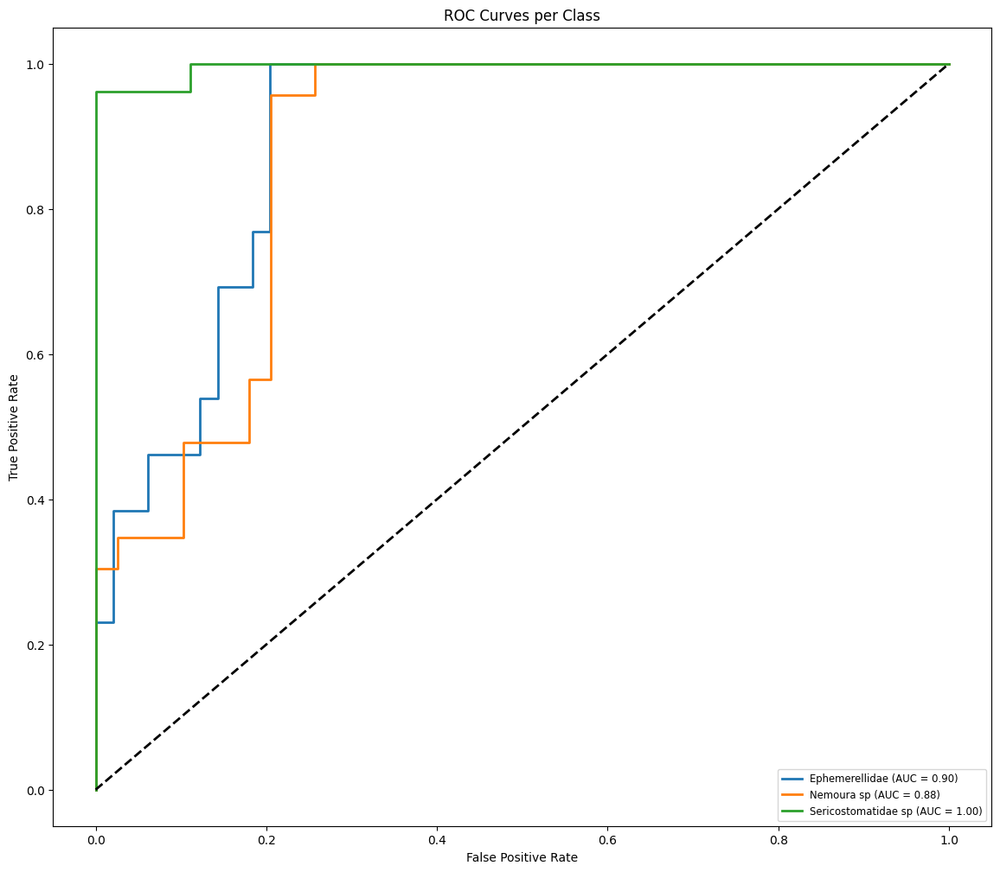

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import (
    confusion_matrix, ConfusionMatrixDisplay,
    precision_recall_fscore_support,
    roc_curve, auc
)
from sklearn.preprocessing import label_binarize
import tensorflow as tf

# Aggregate true labels and predictions from validation dataset
y_true = []
y_pred = []
y_score = []

for images, labels in val_ds:
    preds = model.predict(images)
    y_true.extend(labels.numpy())
    y_pred.extend(np.argmax(preds, axis=1))
    y_score.extend(preds)

y_true = np.array(y_true)
y_pred = np.array(y_pred)
y_score = np.array(y_score)

# Confusion Matrix
cm = confusion_matrix(y_true, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=class_names)
plt.figure(figsize=(12, 12))
disp.plot(cmap=plt.cm.Blues, xticks_rotation='vertical')
plt.title('Confusion Matrix')
plt.show()

# Precision, Recall and F1-score
precision, recall, f1, _ = precision_recall_fscore_support(
    y_true, y_pred, average='weighted'  # options: 'micro', 'macro', None...
)
print(f"Precision: {precision:.4f}")
print(f"Recall:    {recall:.4f}")
print(f"F1-score:  {f1:.4f}")

# ROC Curve and AUC for multi-class
n_classes = len(class_names)
y_true_bin = label_binarize(y_true, classes=range(n_classes))

fpr = dict()
tpr = dict()
roc_auc = dict()

plt.figure(figsize=(14, 12))
for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_true_bin[:, i], y_score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
    plt.plot(fpr[i], tpr[i], lw=2, label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

plt.plot([0, 1], [0, 1], 'k--', lw=2)
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curves per Class')
plt.legend(loc='lower right', fontsize='small')
plt.show()

**STEP 10**

Running inference on images from 'test_images' folder...
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
Original Image: CPH-Sericostomatidae sp.-2287-t.png --> Predicted: Nemoura sp (99.25%)


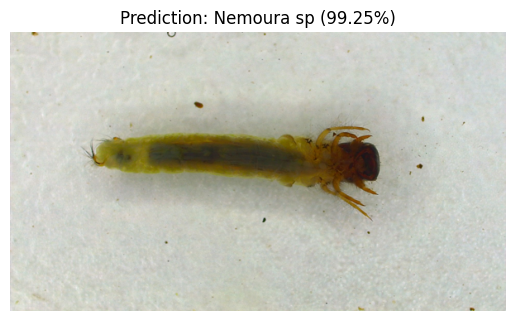

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: CPH-Sericostomatidae sp.-2282-t.png --> Predicted: Nemoura sp (97.94%)


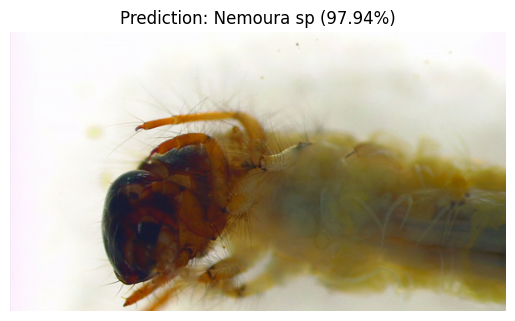

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step
Original Image: CPH-Sericostomatidae sp.-2229-t.png --> Predicted: Nemoura sp (99.91%)


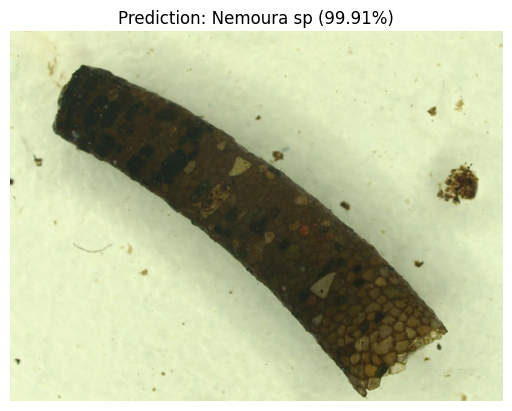

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 708ms/step
Original Image: CPH-Sericostomatidae sp.-2231-t.png --> Predicted: Nemoura sp (99.99%)


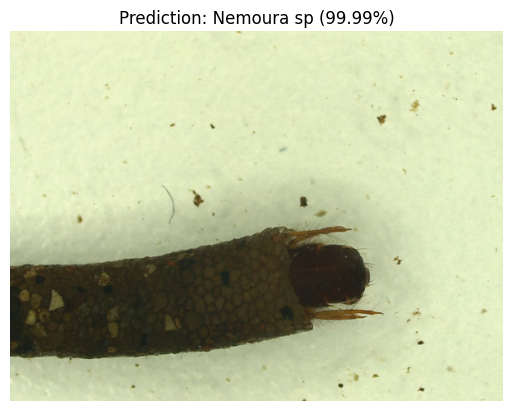

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step
Original Image: CPH-Sericostomatidae sp.-2269-t.png --> Predicted: Nemoura sp (99.70%)


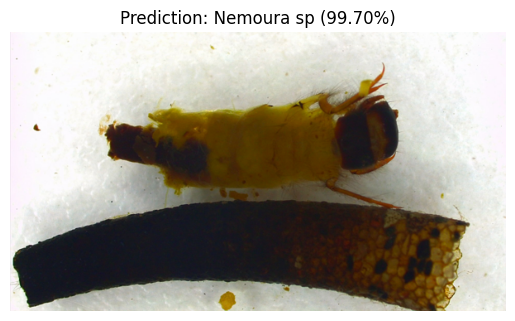

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step
Original Image: CPH-Ephemerellidae-571-t.png --> Predicted: Nemoura sp (99.97%)


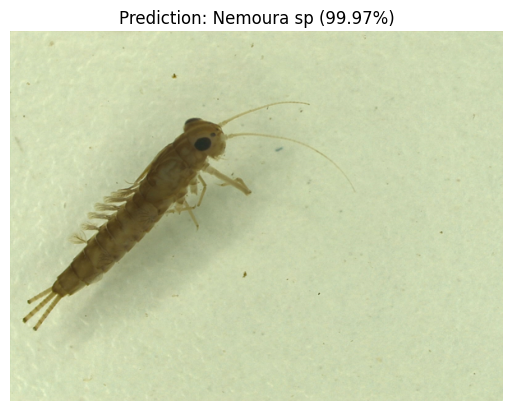

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 729ms/step
Original Image: CPH-Ephemerellidae-589-t.png --> Predicted: Nemoura sp (99.68%)


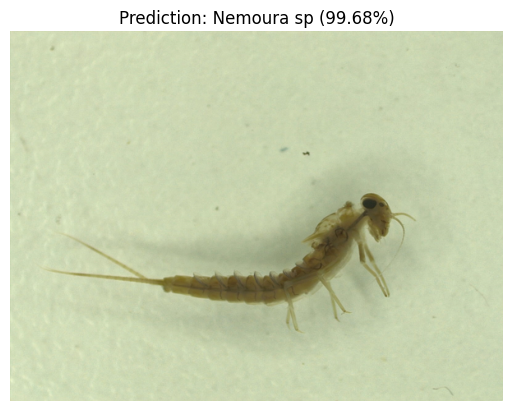

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: CPH-Ephemerellidae-607-t.png --> Predicted: Nemoura sp (98.45%)


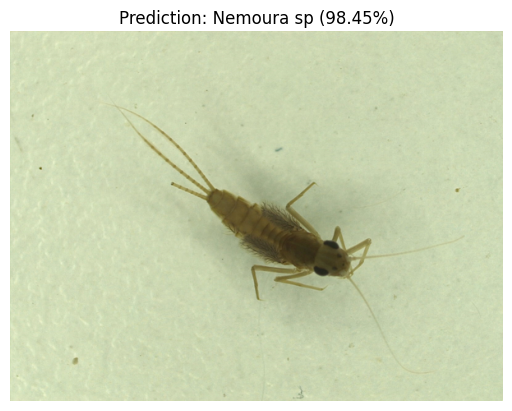

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: CPH-Ephemerellidae-578-t.png --> Predicted: Nemoura sp (99.99%)


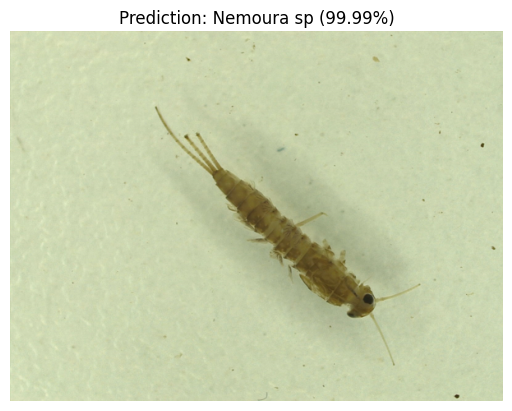

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: CPH-Ephemerellidae-599-t.png --> Predicted: Nemoura sp (99.54%)


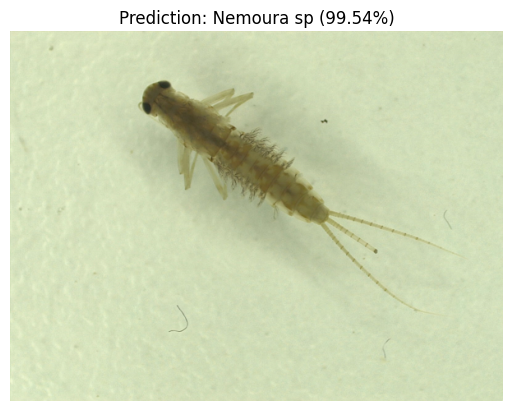

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
Original Image: CPH-Nemoura sp.-2032-t.png --> Predicted: Nemoura sp (93.42%)


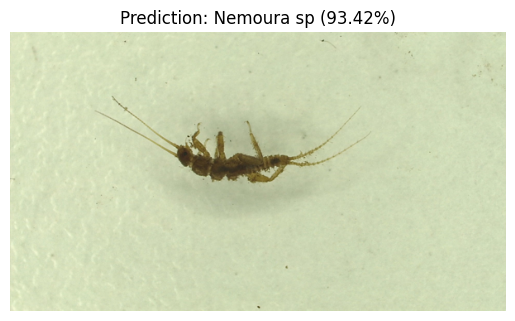

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step
Original Image: CPH-Nemoura sp.-2015-t.png --> Predicted: Nemoura sp (80.30%)


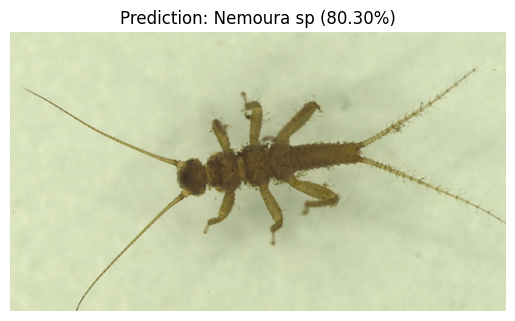

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 783ms/step
Original Image: CPH-Nemoura sp.-1989-t.png --> Predicted: Nemoura sp (67.11%)


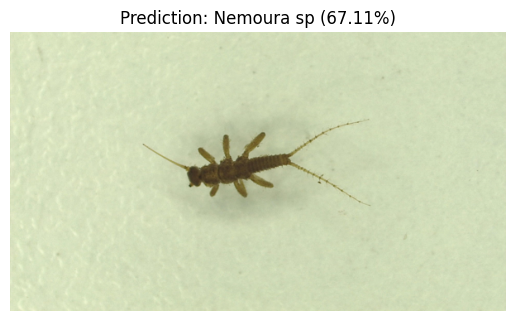

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 771ms/step
Original Image: CPH-Nemoura sp.-2025-t.png --> Predicted: Sericostomatidae sp (50.95%)


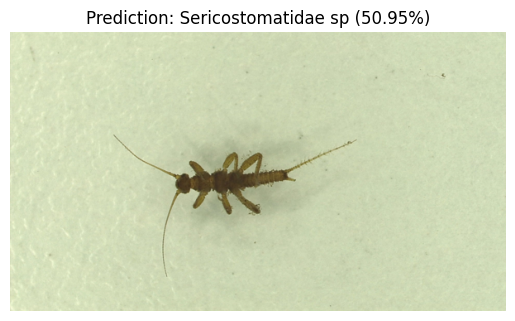

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 783ms/step
Original Image: CPH-Nemoura sp.-2006-t.png --> Predicted: Nemoura sp (98.59%)


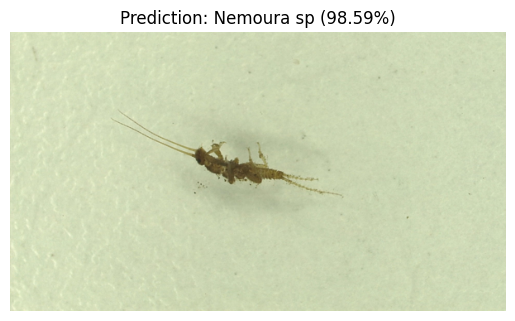

In [ ]:
# === STEP 10: Inference on new images in 'test_images' folder ===

#TEST_IMAGE_DIR = 'test_images'
TEST_IMAGE_DIR = '/content/drive/MyDrive/Bachelor of Software Engineering/Year 1, Sem 1/Software Technology 1 (4483) /Tutorial Material/Week 8 Lab Work/Assets/insects_dataset/test_data'
os.makedirs(TEST_IMAGE_DIR, exist_ok=True)

# Ensure IMG_SIZE is treated as a tuple for this function
_target_img_size = (IMG_SIZE, IMG_SIZE) if not isinstance(IMG_SIZE, tuple) else IMG_SIZE

def load_and_preprocess_image(img_path, img_size=_target_img_size):
    img = image.load_img(img_path, target_size=img_size)
    img_array = image.img_to_array(img) / 255.0
    img_array = np.expand_dims(img_array, axis=0)  # batch size 1
    return img_array

def predict_new_images(test_dir):
    img_files = [f for f in os.listdir(test_dir) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
    if not img_files:
        print(f"No images found in '{test_dir}'. Please add some images and rerun.")
        return

    for img_file in img_files:
        path = os.path.join(test_dir, img_file)
        img_arr = load_and_preprocess_image(path)
        preds = model.predict(img_arr)
        pred_idx = np.argmax(preds[0])
        confidence = preds[0][pred_idx]

        print(f"Original Image: {img_file} --> Predicted: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        img = image.load_img(path)
        plt.imshow(img)
        plt.axis('off')
        plt.title(f"Prediction: {class_names[pred_idx]} ({confidence*100:.2f}%)")
        plt.show()

print("Running inference on images from 'test_images' folder...")
predict_new_images(TEST_IMAGE_DIR)